# CheXpert Lungs Dataset

- [dataset](https://stanfordmlgroup.github.io/competitions/chexpert/)
- [Read the Paper (Irvin & Rajpurkar et al.)](https://arxiv.org/abs/1901.07031)


## What is CheXpert?

CheXpert is a large dataset of chest X-rays and competition for automated chest x-ray interpretation, which features uncertainty labels and radiologist-labeled reference standard evaluation sets.


## Why CheXpert?

Chest radiography is the most common imaging examination globally, critical for screening, diagnosis, and management of many life threatening diseases. Automated chest radiograph interpretation at the level of practicing radiologists could provide substantial benefit in many medical settings, from improved workflow prioritization and clinical decision support to large-scale screening and global population health initiatives. For progress in both development and validation of automated algorithms, we realized there was a need for a labeled dataset that (1) was large, (2) had strong reference standards, and (3) provided expert human performance metrics for comparison.

# Imports

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
from PIL import Image
from torchvision.utils import make_grid
import torchvision.transforms.functional as TF
import albumentations as A
from albumentations.pytorch import ToTensorV2
from tqdm.auto import tqdm
from pathlib import Path
from collections import Counter

tqdm.pandas()

# Basic Data Preparation

In [2]:
base_path = Path('/kaggle/input/chexpert')

In [3]:
train_df = pd.read_csv('/kaggle/input/chexpert/CheXpert-v1.0-small/train.csv')
valid_df = pd.read_csv('/kaggle/input/chexpert/CheXpert-v1.0-small/valid.csv')

train_df['Path'] = train_df['Path'].progress_map(lambda p: base_path/Path(p))
valid_df['Path'] = valid_df['Path'].progress_map(lambda p: base_path/Path(p))

  0%|          | 0/223414 [00:00<?, ?it/s]

  0%|          | 0/234 [00:00<?, ?it/s]

# Samples from the dataset

In [4]:
basic_tfms = A.Compose([
    A.Resize(320,320),
    ToTensorV2()
])

In [5]:
def open_im(p):
    im = Image.open(p).convert('RGB')
    return np.array(im)


def show(imgs,suptitle='Samples'):
    plt.rcParams["figure.figsize"] = [12,12]
    if not isinstance(imgs, list):
        imgs = [imgs]
    fig, axs = plt.subplots(ncols=len(imgs), squeeze=False)
    for i, img in enumerate(imgs):
        img = img.detach()
        img = TF.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
    plt.suptitle(suptitle,y=0.9,fontsize=12)
    plt.show()

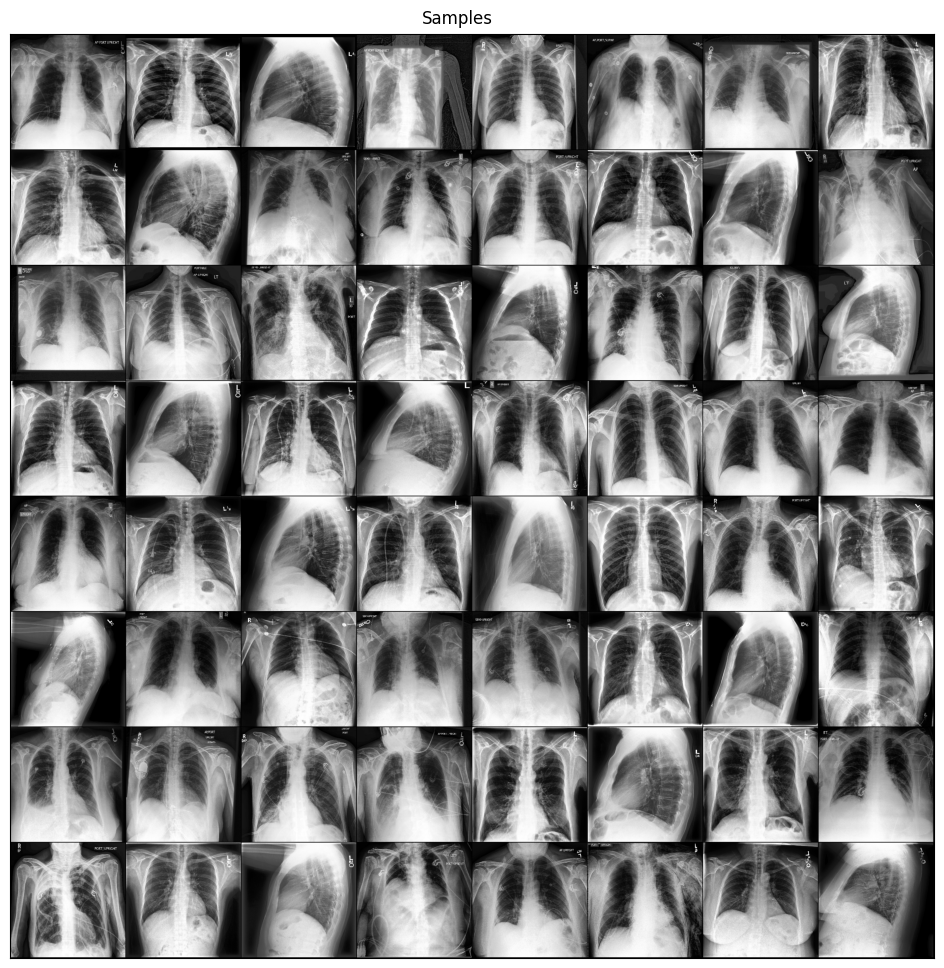

In [6]:
samples = [basic_tfms(image=open_im(valid_df['Path'][i]))['image'] for i in range(64)]
g=make_grid(samples, nrow=8)
show(g)
plt.show()

# Target Columns for Training Models

- we have all possible labels: `all_target_cols`
- labels which were specific to CheXpert competition: `target_cols`

## imputation:

- fill N/A values with 0
- keep uncertain (-1) values, I'll be masking these labels from the calculated loss, hence keeping
    - other methods to replace uncertain values: replace with 0s, replace with 1s, create a new class (2) corresponding to uncertainty prediction


In [7]:
all_target_cols = [
    'No Finding',
    'Enlarged Cardiomediastinum', 'Cardiomegaly', 'Lung Opacity',
    'Lung Lesion', 'Edema', 'Consolidation', 'Pneumonia', 'Atelectasis',
    'Pneumothorax', 'Pleural Effusion', 'Pleural Other', 'Fracture',
    'Support Devices'
]
target_cols = ['No Finding', 'Atelectasis', 'Cardiomegaly', 'Consolidation', 'Edema', 'Pleural Effusion']



keep_cols = ['Path'] + target_cols

In [8]:
train_df[keep_cols].head()

,Path,No Finding,Atelectasis,Cardiomegaly,Consolidation,Edema,Pleural Effusion
0,/kaggle/input/chexpert/CheXpert-v1.0-small/tra...,1.0,NaN,NaN,NaN,NaN,NaN
1,/kaggle/input/chexpert/CheXpert-v1.0-small/tra...,NaN,-1.0,-1.0,-1.0,-1.0,-1.0
2,/kaggle/input/chexpert/CheXpert-v1.0-small/tra...,NaN,NaN,NaN,-1.0,NaN,NaN
3,/kaggle/input/chexpert/CheXpert-v1.0-small/tra...,NaN,NaN,NaN,-1.0,NaN,NaN
4,/kaggle/input/chexpert/CheXpert-v1.0-small/tra...,NaN,NaN,NaN,NaN,1.0,NaN


In [9]:
train_df.groupby(['Frontal/Lateral'])['AP/PA'].value_counts()

Frontal/Lateral  AP/PA
Frontal          AP       161590
                 PA        29420
                 LL           16
                 RL            1
Name: count, dtype: int64

# Value Counts per Column

In [10]:
for col in target_cols:
    print(train_df[col].value_counts(dropna=False))
    print('----\n\n')

No Finding
NaN    201033
1.0     22381
Name: count, dtype: int64
----


Atelectasis
 NaN    154971
-1.0     33739
 1.0     33376
 0.0      1328
Name: count, dtype: int64
----


Cardiomegaly
 NaN    177211
 1.0     27000
 0.0     11116
-1.0      8087
Name: count, dtype: int64
----


Consolidation
 NaN    152792
 0.0     28097
-1.0     27742
 1.0     14783
Name: count, dtype: int64
----


Edema
 NaN    137458
 1.0     52246
 0.0     20726
-1.0     12984
Name: count, dtype: int64
----


Pleural Effusion
 NaN    90203
 1.0    86187
 0.0    35396
-1.0    11628
Name: count, dtype: int64
----




In [11]:
train_df.fillna(value=0,inplace=True)
valid_df.fillna(value=0,inplace=True)


train_df[all_target_cols] = train_df[all_target_cols].astype(int)
valid_df[all_target_cols] = valid_df[all_target_cols].astype(int)

In [12]:
train_df = train_df.drop(columns=[c for c in train_df.columns if c not in keep_cols])
valid_df = valid_df.drop(columns=[c for c in valid_df.columns if c not in keep_cols])

In [13]:
train_df.shape, valid_df.shape

((223414, 7), (234, 7))

# Value Counts as per label

In [14]:
for l in [-1,0,1]:
    print(l)
    print(train_df[train_df[target_cols]==l][target_cols].count(),'\n')

-1
No Finding              0
Atelectasis         33739
Cardiomegaly         8087
Consolidation       27742
Edema               12984
Pleural Effusion    11628
dtype: int64 

0
No Finding          201033
Atelectasis         156299
Cardiomegaly        188327
Consolidation       180889
Edema               158184
Pleural Effusion    125599
dtype: int64 

1
No Finding          22381
Atelectasis         33376
Cardiomegaly        27000
Consolidation       14783
Edema               52246
Pleural Effusion    86187
dtype: int64 



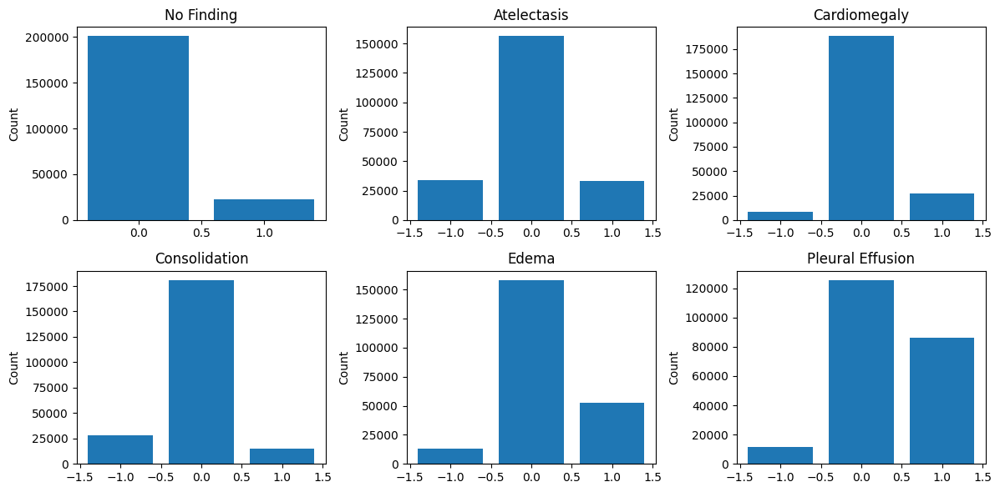

In [15]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(12, 6))
for ax, col in zip(axes.flat, target_cols):
    data = train_df[col].value_counts().to_dict()
    ax.bar(data.keys(), data.values())
    ax.set_title(col)
    ax.set_ylabel('Count')
plt.tight_layout()
plt.show()

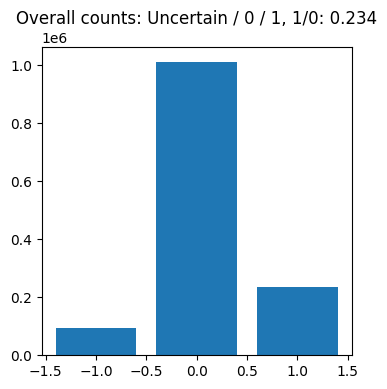

In [16]:
plt.figure(figsize=(4,4))
all_counts = Counter(train_df[target_cols].values.flatten().tolist())
plt.bar(x=all_counts.keys(),height=all_counts.values())
plt.title(f'Overall counts: Uncertain / 0 / 1, 1/0: {(all_counts[1] / all_counts[0]):.3f}')
plt.show()

# Train and Validation Augmentations

- using `albumentations` package

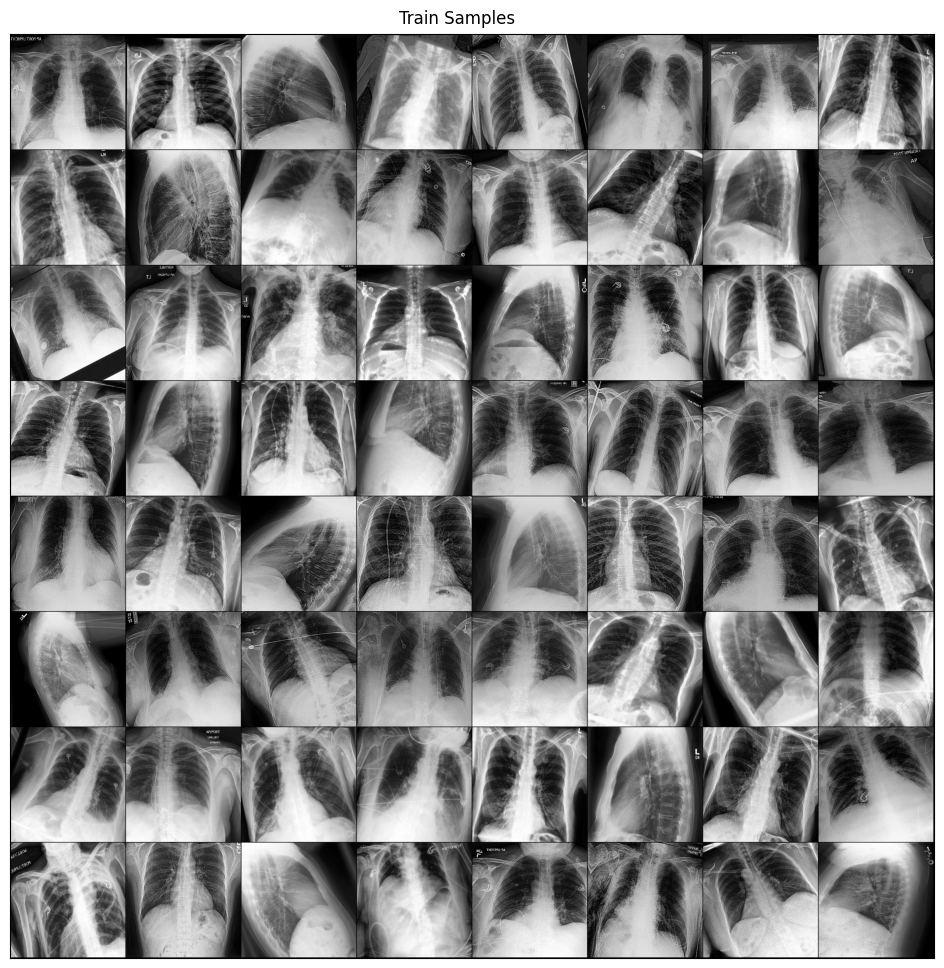

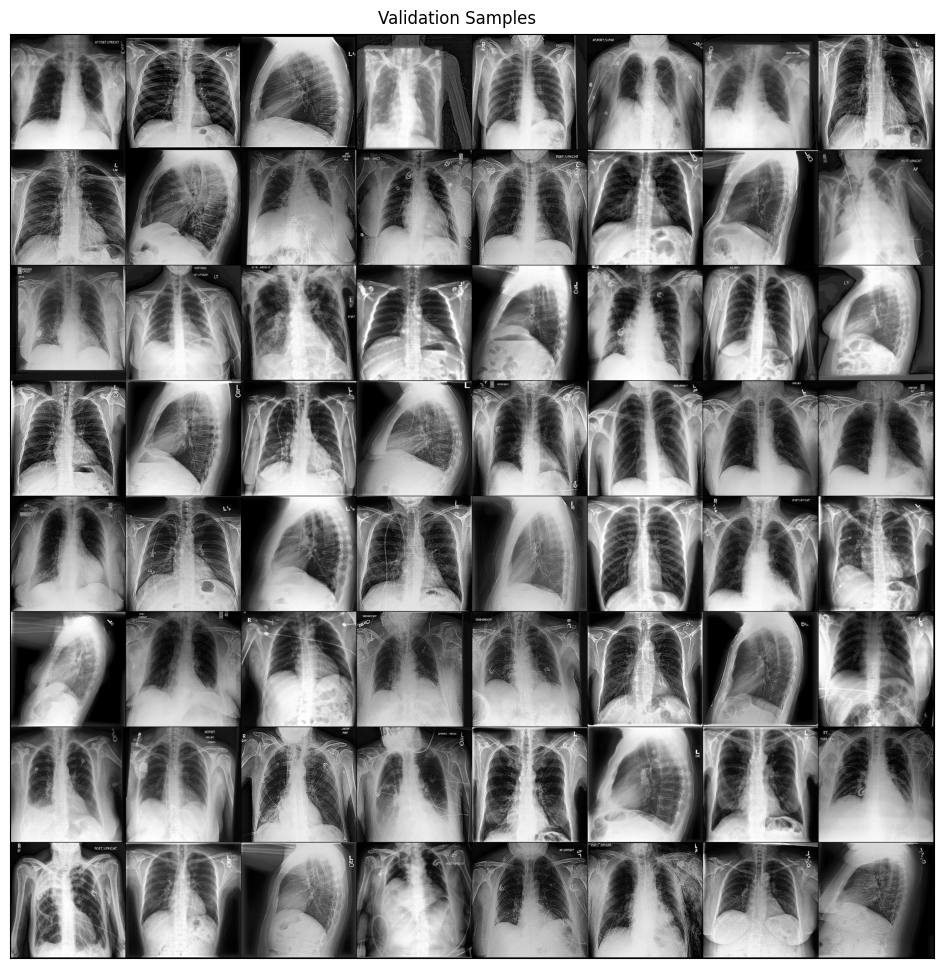

In [17]:
train_tfms = A.Compose([
    A.Rotate(25),
    A.RandomResizedCrop(384,384,scale=(0.65,1.0)),
    A.HorizontalFlip(),
    A.Sharpen(),
    ToTensorV2(),
])
valid_tfms = A.Compose([
    A.Resize(384,384),
    A.Sharpen(),
    ToTensorV2(),
])

samples = [train_tfms(image=open_im(valid_df['Path'][i]))['image'] for i in range(64)]
g=make_grid(samples, nrow=8)
show(g,suptitle='Train Samples')
print('\n'*5)
samples = [valid_tfms(image=open_im(valid_df['Path'][i]))['image'] for i in range(64)]
g=make_grid(samples, nrow=8)
show(g,suptitle='Validation Samples')

# Creating PyTorch Dataset

In [18]:
class Dataset:
    def __init__(self, df, transforms, all_targets=False):
        self.df = df
        self.transforms = transforms
        self.all_targets = all_targets
        self.all_target_cols = [
            'No Finding',
            'Enlarged Cardiomediastinum', 'Cardiomegaly', 'Lung Opacity',
            'Lung Lesion', 'Edema', 'Consolidation', 'Pneumonia', 'Atelectasis',
            'Pneumothorax', 'Pleural Effusion', 'Pleural Other', 'Fracture',
            'Support Devices'
        ]
        self.target_cols = [
            'No Finding', 
            'Atelectasis', 'Cardiomegaly', 
            'Consolidation', 'Edema', 'Pleural Effusion'
        ]
        
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        sample = self.df.iloc[idx,:]
        img = Image.open(sample['Path']).convert('RGB')
        img = np.array(img)
        img = self.transforms(image=img)['image']
        label_cols = self.all_target_cols if self.all_targets else self.target_cols
        labels = torch.tensor(sample[label_cols].tolist()).float()
        return img, labels

In [19]:
train_ds = Dataset(train_df,train_tfms)

In [20]:
x,y = train_ds[95]
x.shape, y

(torch.Size([3, 384, 384]), tensor([ 0., -1.,  0.,  0.,  0.,  0.]))

# Image Samples per Disease

In [21]:
def show_samples(df,rows,cols,disease):
    
    R = A.Resize(384,384)
    samples = df[df[disease]==1]['Path'].sample(frac=1).reset_index(drop=True)
    fig = plt.figure(figsize=(cols*4,rows*4))
    # plotting
    for i in range(rows*cols):
        img = R(image=open_im(samples[i]))['image']
        fig.add_subplot(rows,cols,i+1)
        plt.imshow(img)
        plt.axis('off')
    plt.tight_layout()
    plt.suptitle(disease,y=1.01,fontsize=20)
    plt.show()

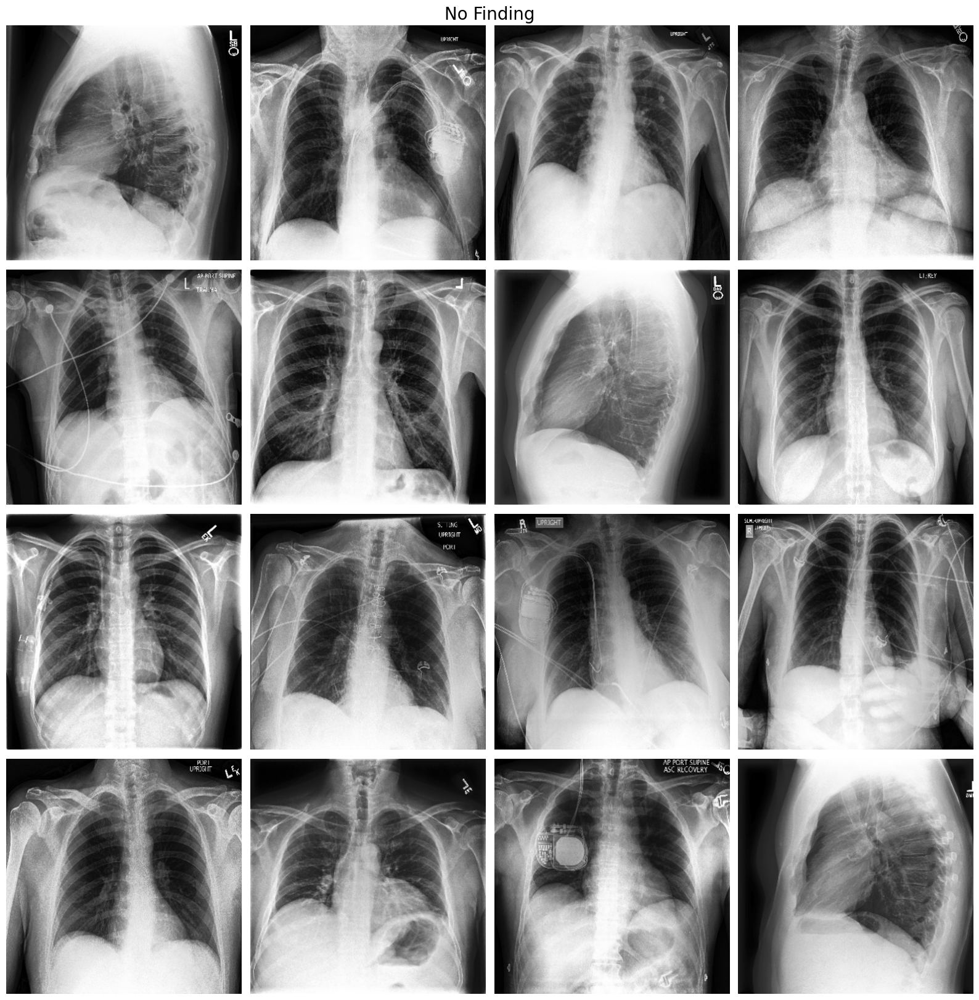

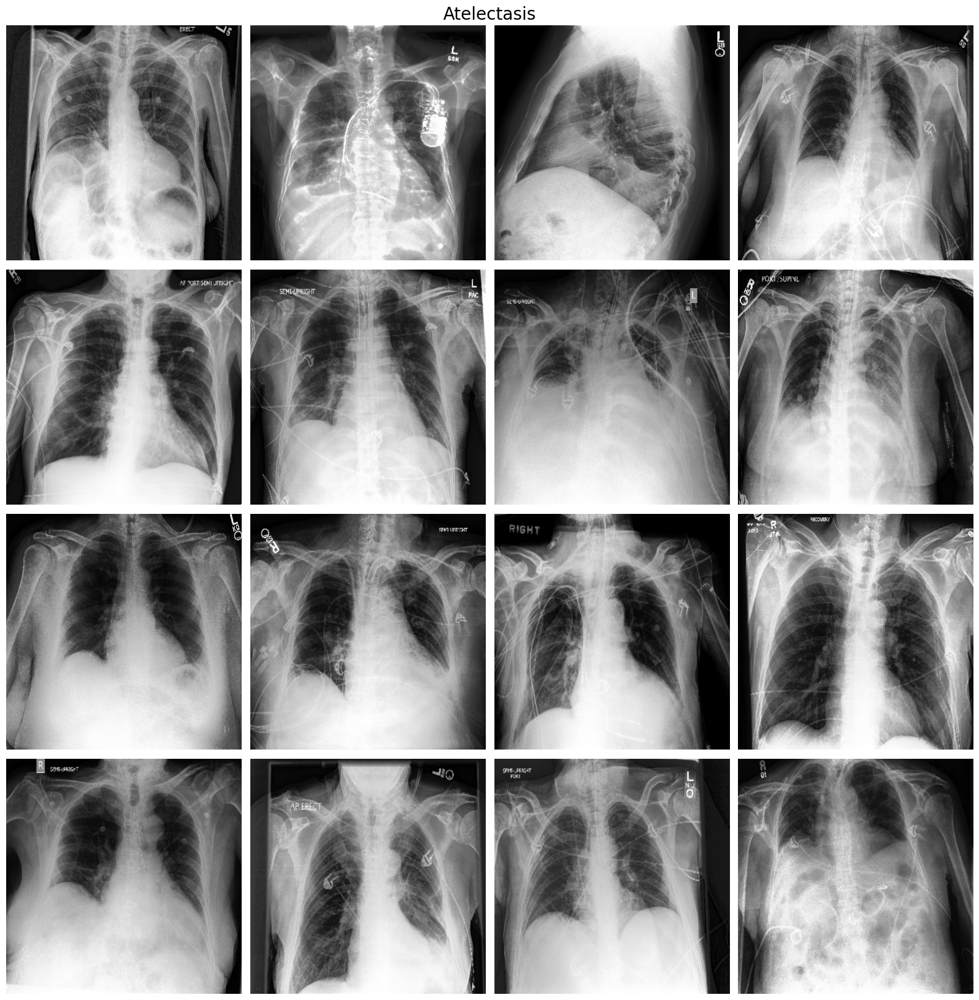

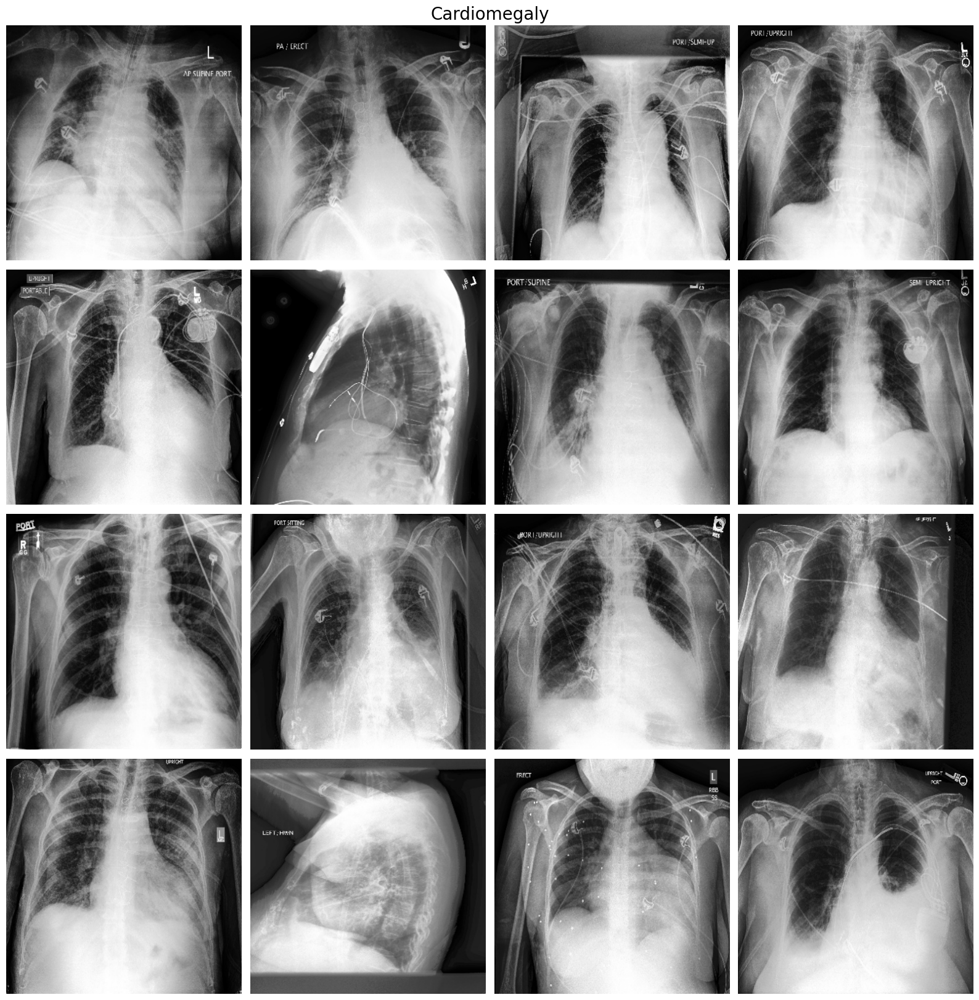

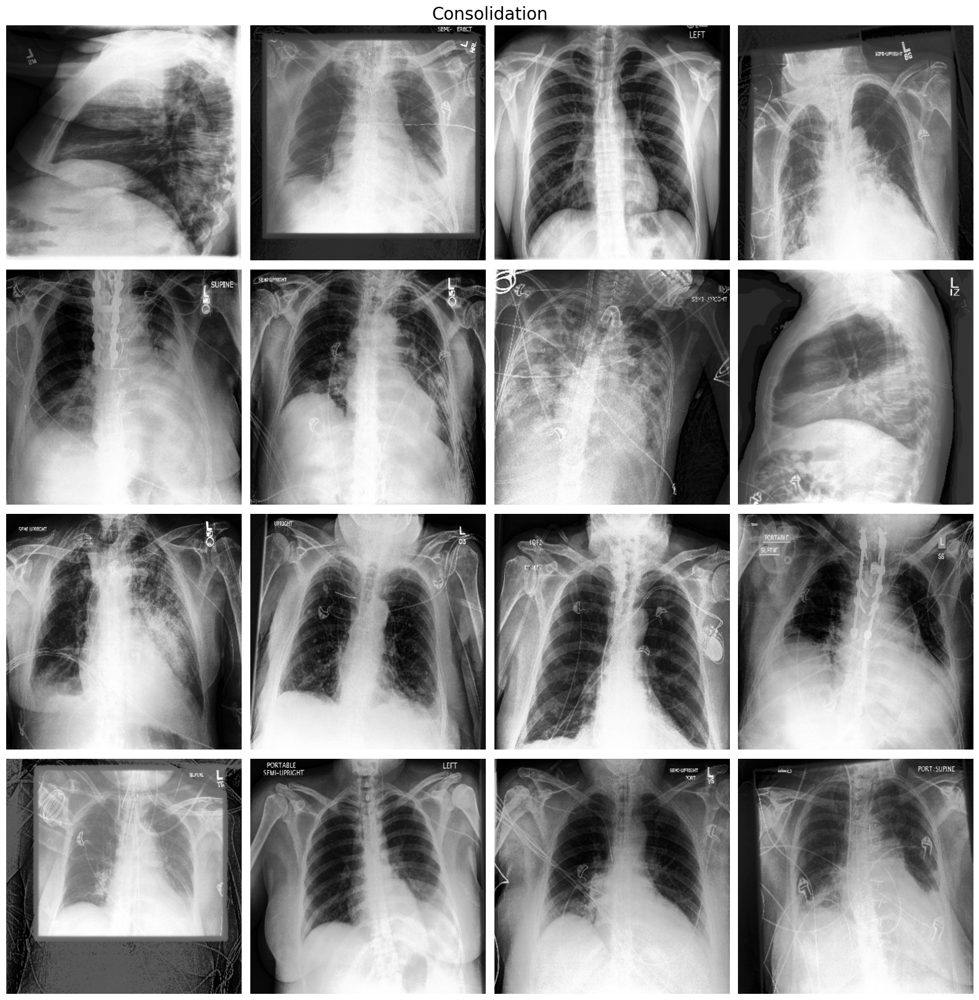

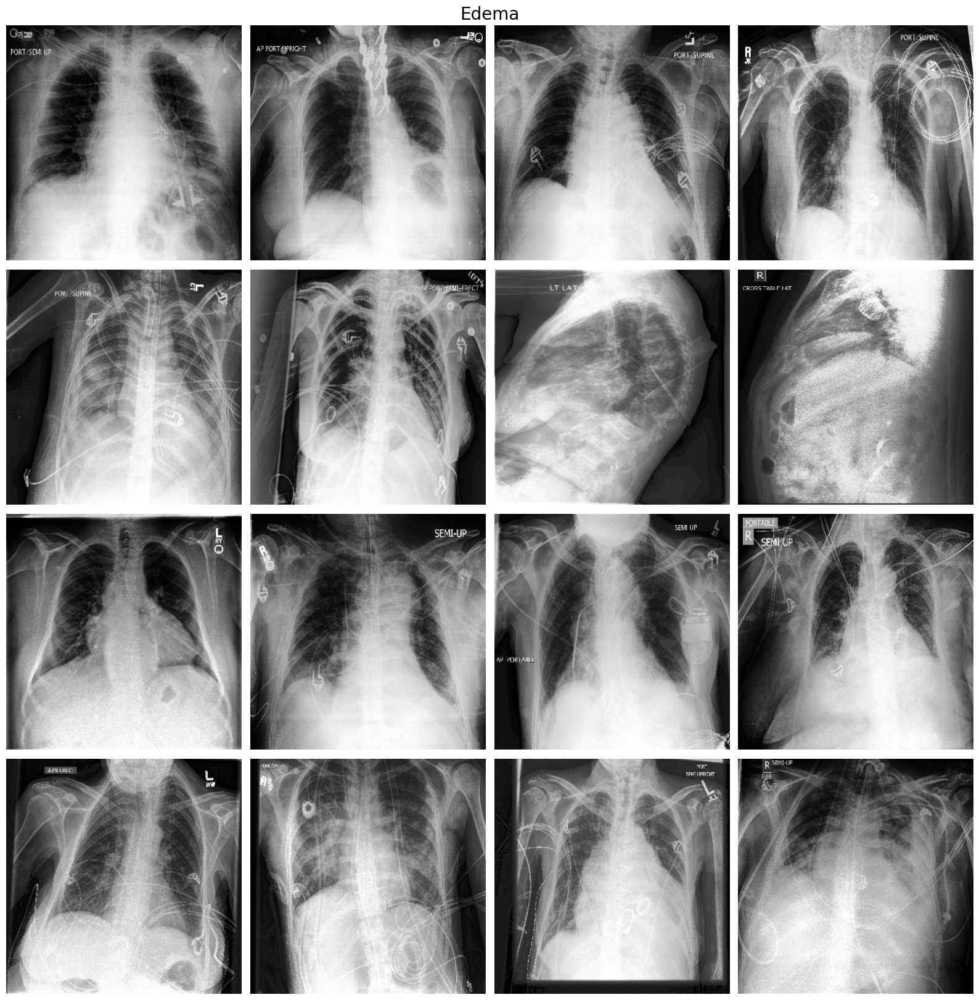

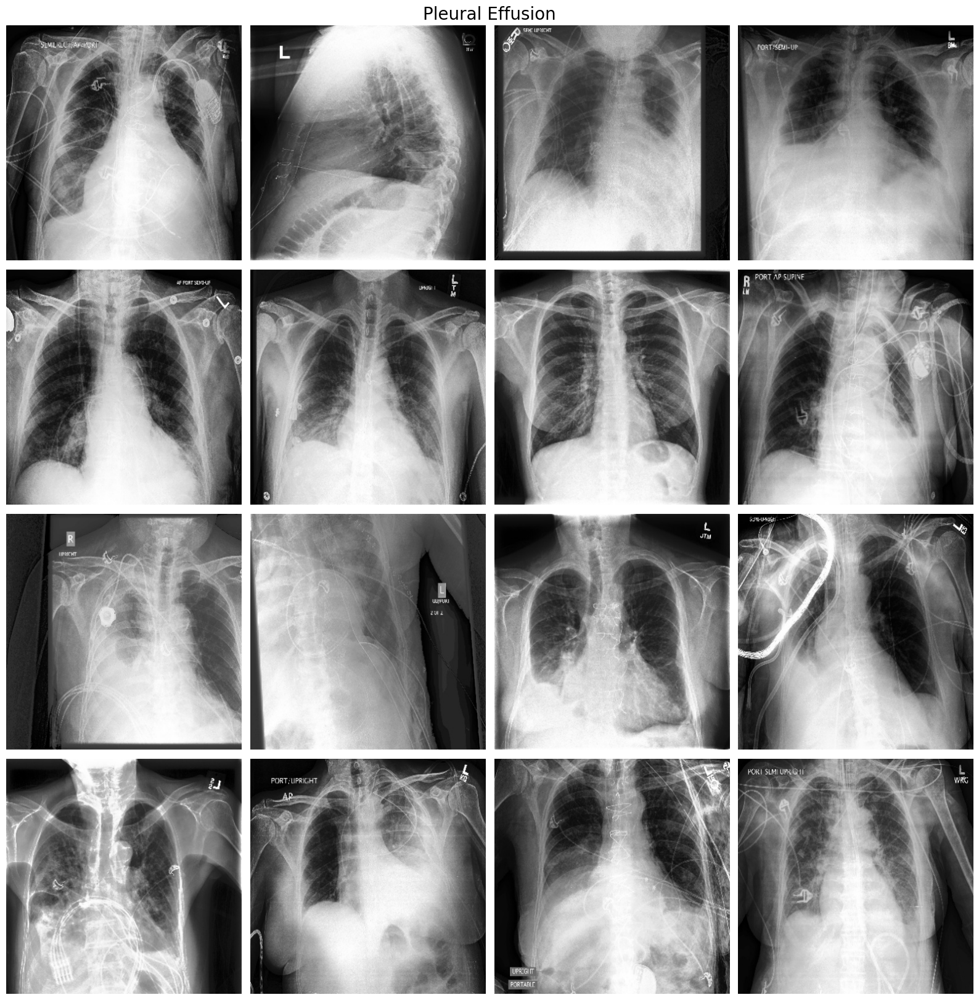

In [22]:
for d in target_cols:
    show_samples(train_df,4,4,d)
    print('\n'*5)

# Thank You for Checking Out My Work!

## Follow **[@shreydan](https://kaggle.com/shreydan)** if you haven't already!

### Stay Tuned for more notebooks on this dataset :)